In [1]:
from google.colab import drive
drive.mount('/content/drive')

import os

base_dir = '/content/drive/MyDrive/lfw_project'

os.makedirs(base_dir, exist_ok=True)

print("✅ All files will be saved here:", base_dir)


Mounted at /content/drive
✅ All files will be saved here: /content/drive/MyDrive/lfw_project


In [ ]:
import kagglehub
import shutil
import os

path = kagglehub.dataset_download("jessicali9530/lfw-dataset")

print("✅ Dataset downloaded to cache:", path)

dataset_drive_path = os.path.join(base_dir, "lfw-dataset")
if not os.path.exists(dataset_drive_path):
    shutil.copytree(path, dataset_drive_path)
    print("📂 Dataset copied to Google Drive:", dataset_drive_path)
else:
    print("⚡ Already exists in Google Drive:", dataset_drive_path)


Using Colab cache for faster access to the 'lfw-dataset' dataset.
✅ Dataset downloaded to cache: /kaggle/input/lfw-dataset
📂 Dataset copied to Google Drive: /content/drive/MyDrive/lfw_project/lfw-dataset


In [ ]:
import os

images_root = os.path.join(base_dir, "lfw-dataset", "lfw-deepfunneled", "lfw-deepfunneled")

print("Total persons:", len(os.listdir(images_root)))

first_person = os.listdir(images_root)[0]
print("Example person:", first_person)
print("Images:", os.listdir(os.path.join(images_root, first_person))[:5])


Total persons: 5749
Example person: Tyler_Hamilton
Images: ['Tyler_Hamilton_0002.jpg', 'Tyler_Hamilton_0001.jpg']


In [ ]:

total_images = 0
empty_folders = []

for person_id in os.listdir(images_root):
    person_path = os.path.join(images_root, person_id)
    if os.path.isdir(person_path):
        img_files = [f for f in os.listdir(person_path)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        if not img_files:
            empty_folders.append(person_id)
        total_images += len(img_files)

print("Total persons:", len(os.listdir(images_root)))
print("Total images:", total_images)
print("Empty folders count:", len(empty_folders))
print("Example empty folders:", empty_folders[:10])


Total persons: 5749
Total images: 13233
Empty folders count: 0
Example empty folders: []


In [ ]:

yolo_base_dir = os.path.join(base_dir, "lfw_yolo")

for split in ["train", "val", "test"]:
    os.makedirs(os.path.join(yolo_base_dir, split, "images"), exist_ok=True)
    os.makedirs(os.path.join(yolo_base_dir, split, "labels"), exist_ok=True)

print("✅ YOLO folders created at:", yolo_base_dir)


✅ YOLO folders created at: /content/drive/MyDrive/lfw_project/lfw_yolo


In [ ]:
import os, glob, shutil, random

lfw_path = os.path.join(base_dir, "lfw-dataset", "lfw-deepfunneled", "lfw-deepfunneled")

yolo_base_dir = os.path.join(base_dir, "lfw_yolo")

all_imgs = []
for person in os.listdir(lfw_path):
    p_dir = os.path.join(lfw_path, person)
    if os.path.isdir(p_dir):
        all_imgs.extend(glob.glob(os.path.join(p_dir, "*.jpg")))

print("Total images in LFW:", len(all_imgs))

# Shuffle
random.shuffle(all_imgs)

# Split → Train / Val / Test (70% / 15% / 15%)
train_end = int(0.7 * len(all_imgs))
val_end   = int(0.85 * len(all_imgs))

train_files = all_imgs[:train_end]
val_files   = all_imgs[train_end:val_end]
test_files  = all_imgs[val_end:]

def copy_files(files, dest):
    dest_dir = os.path.join(yolo_base_dir, dest, "images")
    os.makedirs(dest_dir, exist_ok=True)
    for f in files:
        shutil.copy(f, os.path.join(dest_dir, os.path.basename(f)))

copy_files(train_files, "train")
copy_files(val_files,   "val")
copy_files(test_files,  "test")

print(f"✅ Train images: {len(train_files)} | Val images: {len(val_files)} | Test images: {len(test_files)}")
print(f"📂 YOLO dataset saved in: {yolo_base_dir}")


Total images in LFW: 13233
✅ Train images: 9263 | Val images: 1985 | Test images: 1985
📂 YOLO dataset saved in: /content/drive/MyDrive/lfw_project/lfw_yolo


In [ ]:
!pip install ultralytics --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 71.7 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
from huggingface_hub import hf_hub_download
import os

#  Download YOLOv11n face detection model
model_path = hf_hub_download(repo_id="AdamCodd/YOLOv11n-face-detection", filename="model.pt")
model = YOLO(model_path)

#  Dataset base path in Google Drive
yolo_base_dir = os.path.join(base_dir, "lfw_yolo")
splits = ["train", "val", "test"]  # modify if you don't have test set

for split in splits:
    img_dir = os.path.join(yolo_base_dir, split, "images")
    label_dir = os.path.join(yolo_base_dir, split, "labels")
    output_img_dir = os.path.join(yolo_base_dir, split, "labeled_images")

    if not os.path.exists(img_dir):
        print(f"⚠️ Skipping {split}, no images found.")
        continue

    os.makedirs(label_dir, exist_ok=True)
    os.makedirs(output_img_dir, exist_ok=True)

    # Process all images
    for idx, img_file in enumerate(os.listdir(img_dir), 1):
        path = os.path.join(img_dir, img_file)
        results = model(path)  # one result per image
        boxes = results[0].boxes

        # Save YOLO TXT label file
        base_name, _ = os.path.splitext(img_file)
        txt_path = os.path.join(label_dir, base_name + ".txt")

        with open(txt_path, "w") as f:
            for i in range(len(boxes)):
                xywhn = boxes.xywhn[i].tolist()   # normalized x,y,w,h
                cls_id = int(boxes.cls[i].item()) # class ID (usually 0 for faces)
                f.write(f"{cls_id} {xywhn[0]} {xywhn[1]} {xywhn[2]} {xywhn[3]}\n")

        # Save image with bounding boxes drawn
        results[0].save(filename=os.path.join(output_img_dir, img_file))

        # Print progress
        if idx % 3000 == 0:
            print(f"✅ {split}: Processed {idx} images...")

    print(f"🎯 Labeling completed for {split} set!")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.pt:   0%|          | 0.00/5.47M [00:00<?, ?B/s]

Streaming output truncated to the last 5000 lines.
Speed: 2.9ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Rudolph_Giuliani_0019.jpg: 640x640 1 face, 7.8ms
Speed: 2.8ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Sarah_Jessica_Parker_0003.jpg: 640x640 1 face, 9.1ms
Speed: 3.0ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Jennifer_Capriati_0016.jpg: 640x640 1 face, 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Tony_Blair_0020.jpg: 640x640 1 face, 9.0ms
Speed: 2.9ms preprocess, 9.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image

In [ ]:
import os

yolo_base_dir = "/content/drive/MyDrive/lfw_project/lfw_yolo"
splits = ["train", "val", "test"]

for split in splits:
    img_dir = os.path.join(yolo_base_dir, split, "images")
    label_dir = os.path.join(yolo_base_dir, split, "labels")
    output_img_dir = os.path.join(yolo_base_dir, split, "labeled_images")

    img_count = len(os.listdir(img_dir)) if os.path.exists(img_dir) else 0
    label_count = len([f for f in os.listdir(label_dir) if f.endswith(".txt")]) if os.path.exists(label_dir) else 0
    labeled_img_count = len(os.listdir(output_img_dir)) if os.path.exists(output_img_dir) else 0

    print(f"📂 {split.upper()} set:")
    print(f"   🖼️ Images: {img_count}")
    print(f"   📝 Labels: {label_count}")
    print(f"   🎨 Labeled Images: {labeled_img_count}")
    print("-" * 40)


📂 TRAIN set:
   🖼️ Images: 9263
   📝 Labels: 9263
   🎨 Labeled Images: 9263
----------------------------------------
📂 VAL set:
   🖼️ Images: 1985
   📝 Labels: 1985
   🎨 Labeled Images: 1985
----------------------------------------
📂 TEST set:
   🖼️ Images: 1985
   📝 Labels: 1985
   🎨 Labeled Images: 1985
----------------------------------------


In [ ]:
yaml_content = """path: /content/drive/MyDrive/lfw_project/lfw_yolo

train: train/images
val: val/images
test: test/images  # optional

nc: 1
names: ["face"]
"""

with open("/content/drive/MyDrive/lfw_project/lfw.yaml", "w") as f:
    f.write(yaml_content)

print("✅ lfw.yaml created with correct paths inside Google Drive!")


✅ lfw.yaml created with correct paths inside Google Drive!


In [ ]:
from ultralytics import YOLO


model = YOLO("yolo11s.pt")

project_dir = "/content/drive/MyDrive/lfw_project/runs"

model.train(
    data="/content/drive/MyDrive/lfw_project/lfw.yaml",
    epochs=40,
    imgsz=640,
    batch=32, # Reduced batch size further to mitigate OOM error
    workers=4,
    patience=10,
    project=project_dir,
    name="yolo11s_lfw"
)

Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/lfw_project/lfw.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo11s_lfw5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fcafb1b29c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
!pip install -U ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.4 MB/s eta 0:00:00


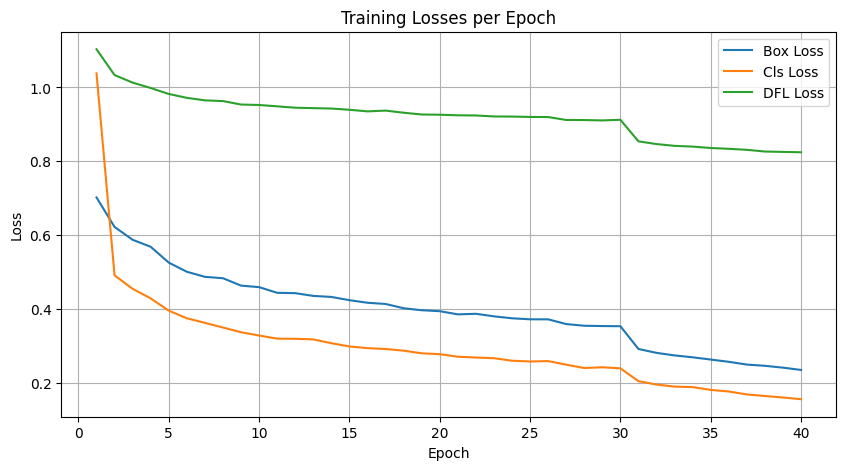

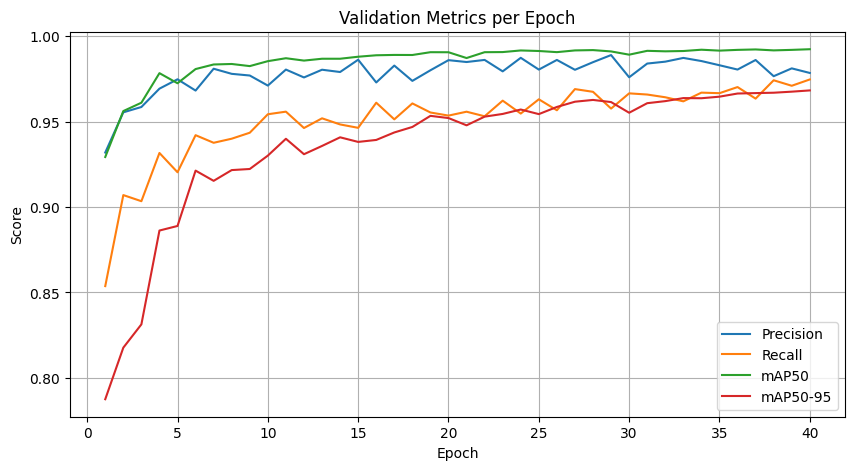

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

results_csv = "/content/drive/MyDrive/lfw_project/runs/yolo11s_lfw5/results.csv"

df = pd.read_csv(results_csv)

# ------------------------
# 📉 Loss curves
# ------------------------
plt.figure(figsize=(10,5))
plt.plot(df['epoch'], df['train/box_loss'], label='Box Loss')
plt.plot(df['epoch'], df['train/cls_loss'], label='Cls Loss')
plt.plot(df['epoch'], df['train/dfl_loss'], label='DFL Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Losses per Epoch")
plt.legend()
plt.grid()
plt.show()

# ------------------------
# 📈 Accuracy curves
# ------------------------
plt.figure(figsize=(10,5))
plt.plot(df['epoch'], df['metrics/precision(B)'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall(B)'], label='Recall')
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP50')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP50-95')
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Validation Metrics per Epoch")
plt.legend()
plt.grid()
plt.show()


🎯 Running inference on: Sean_OKeefe_0002.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Sean_OKeefe_0002.jpg: 640x640 1 face, 17.0ms
Speed: 3.8ms preprocess, 17.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


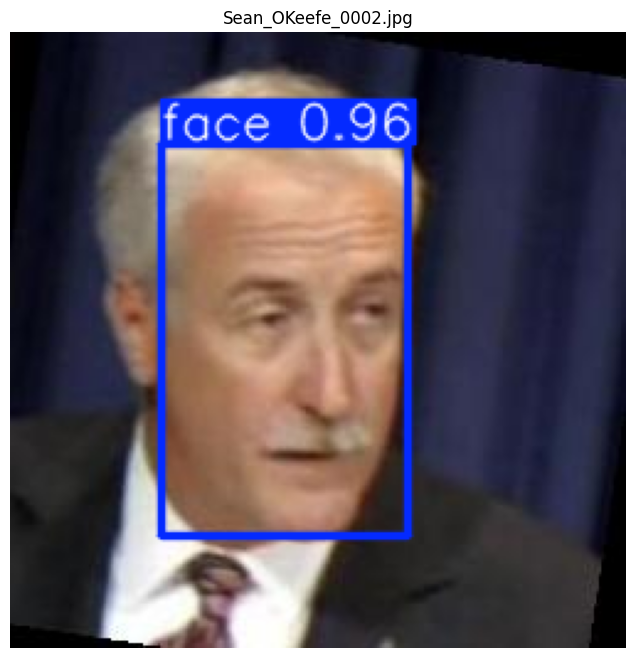

🎯 Running inference on: Simon_Chalk_0001.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Simon_Chalk_0001.jpg: 640x640 1 face, 22.8ms
Speed: 3.1ms preprocess, 22.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


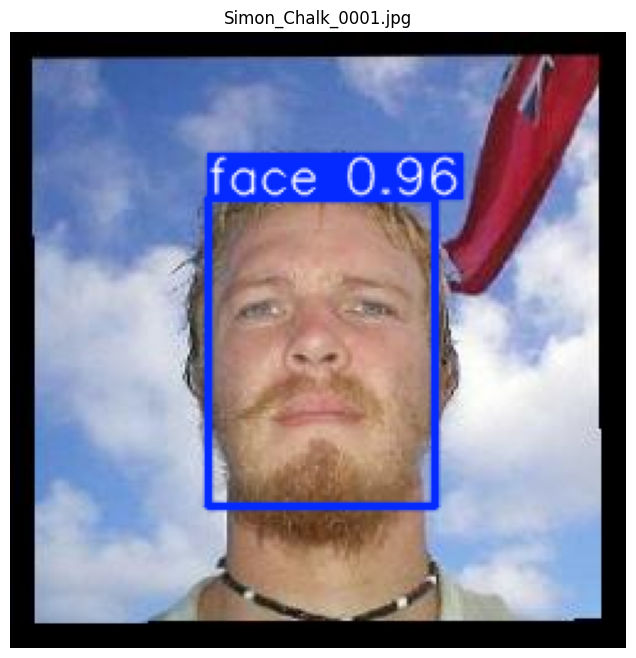

🎯 Running inference on: Hector_Babenco_0003.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Hector_Babenco_0003.jpg: 640x640 2 faces, 22.4ms
Speed: 4.5ms preprocess, 22.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


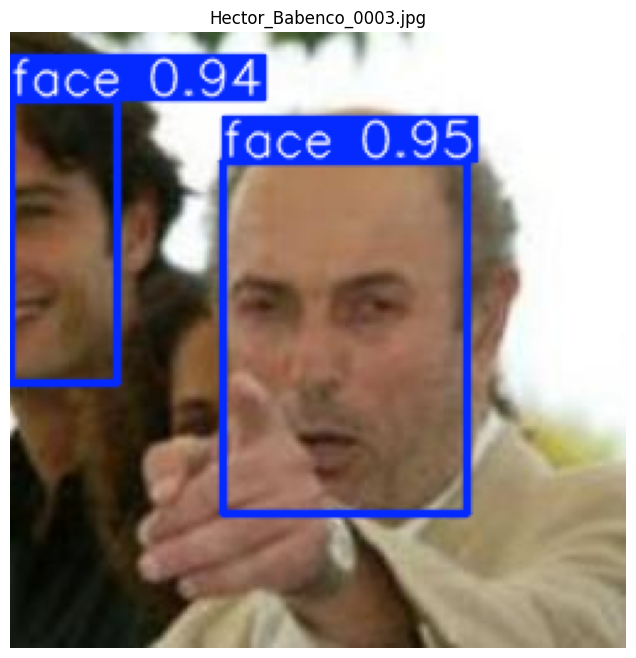

🎯 Running inference on: Moshe_Katsav_0003.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Moshe_Katsav_0003.jpg: 640x640 3 faces, 15.3ms
Speed: 3.2ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


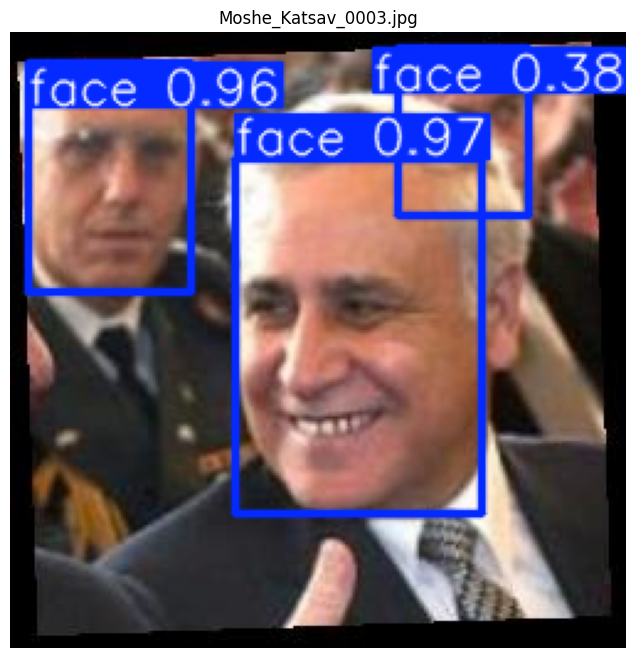

🎯 Running inference on: Daniela_Cicarelli_0001.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Daniela_Cicarelli_0001.jpg: 640x640 1 face, 15.6ms
Speed: 3.3ms preprocess, 15.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


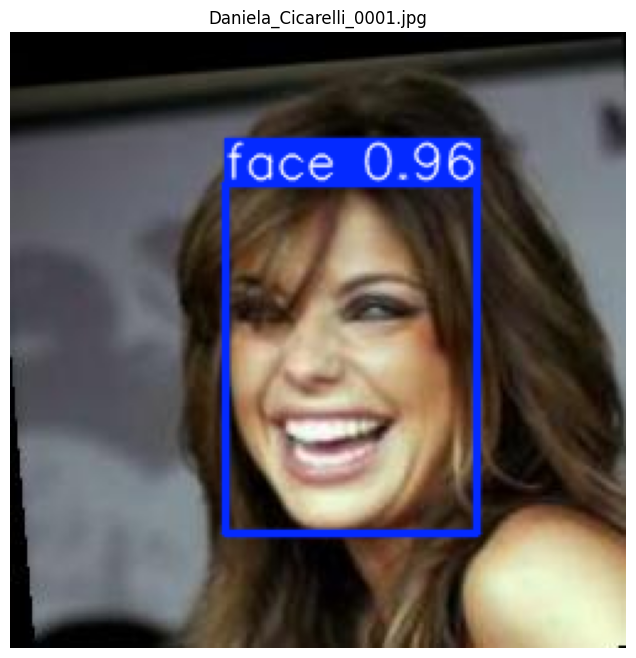

🎯 Running inference on: Cate_Blanchett_0004.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Cate_Blanchett_0004.jpg: 640x640 1 face, 15.3ms
Speed: 3.1ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


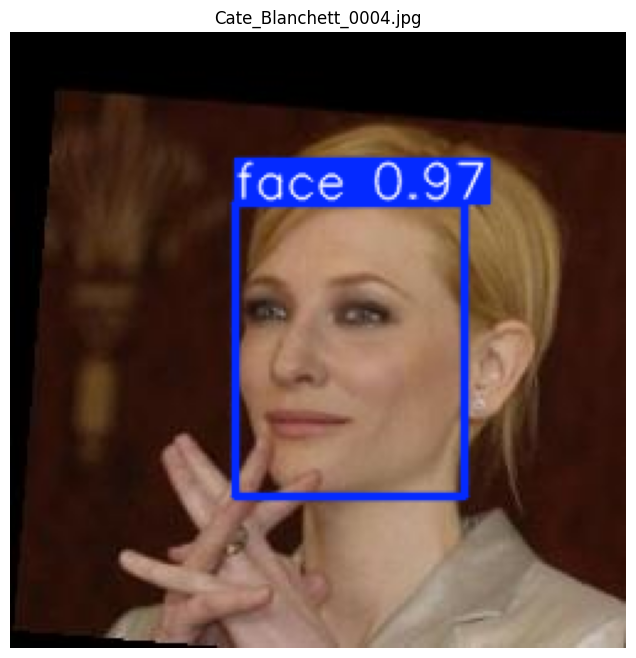

🎯 Running inference on: Marwan_Barghouthi_0002.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Marwan_Barghouthi_0002.jpg: 640x640 2 faces, 15.4ms
Speed: 3.5ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


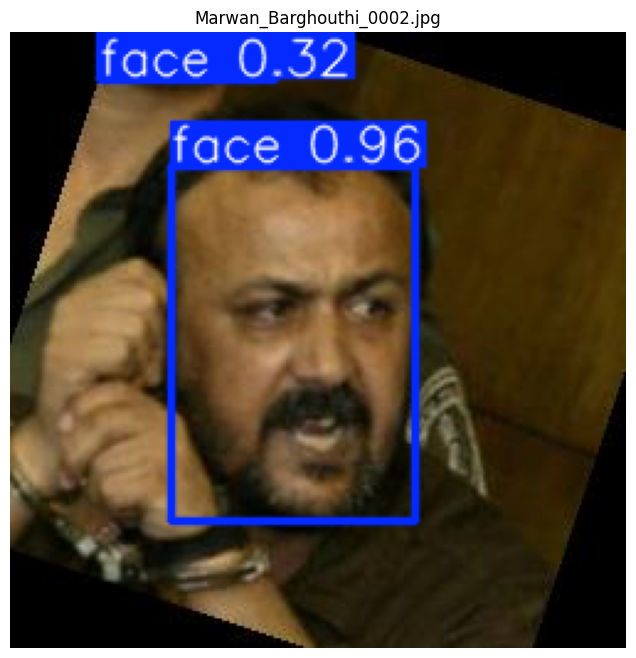

🎯 Running inference on: Tony_Blair_0076.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Tony_Blair_0076.jpg: 640x640 1 face, 15.3ms
Speed: 3.2ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


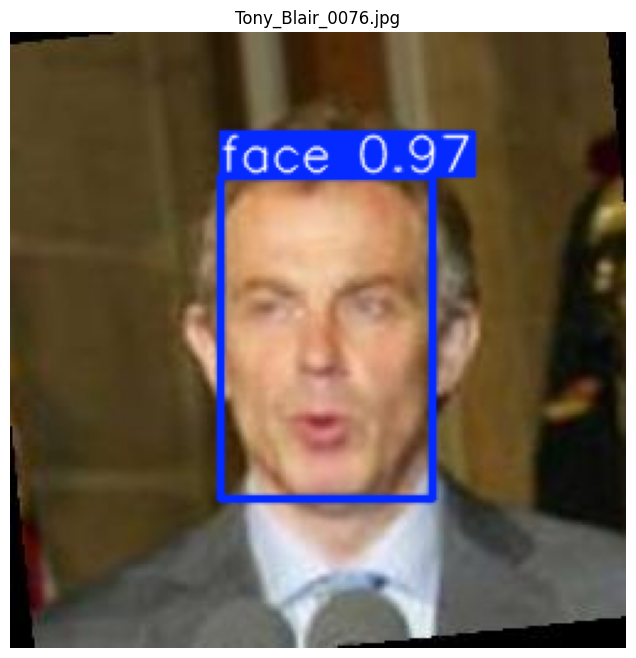

🎯 Running inference on: Michael_Ballack_0002.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Michael_Ballack_0002.jpg: 640x640 1 face, 15.4ms
Speed: 3.7ms preprocess, 15.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


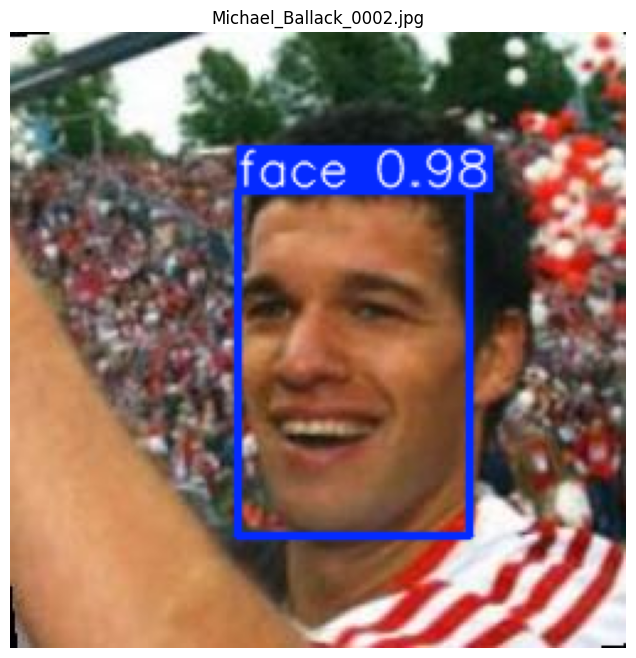

🎯 Running inference on: Silvio_Berlusconi_0029.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Silvio_Berlusconi_0029.jpg: 640x640 1 face, 16.2ms
Speed: 3.3ms preprocess, 16.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


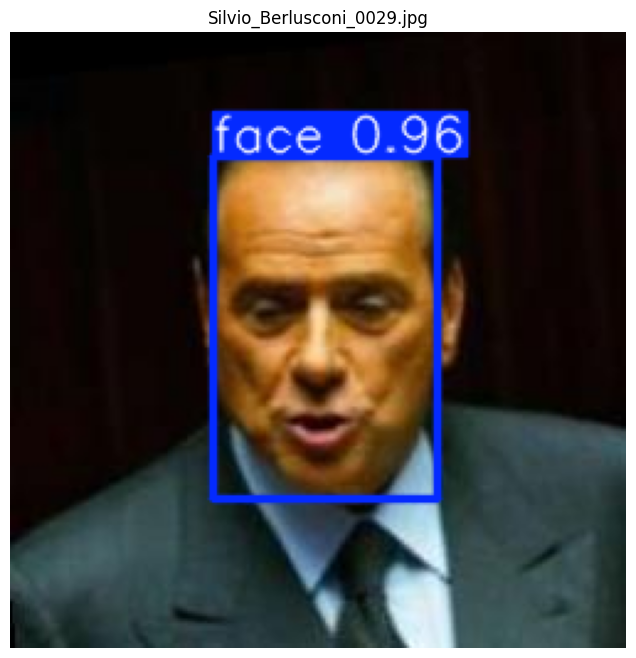

🎯 Running inference on: Jean_Chretien_0042.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Jean_Chretien_0042.jpg: 640x640 1 face, 15.4ms
Speed: 3.2ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


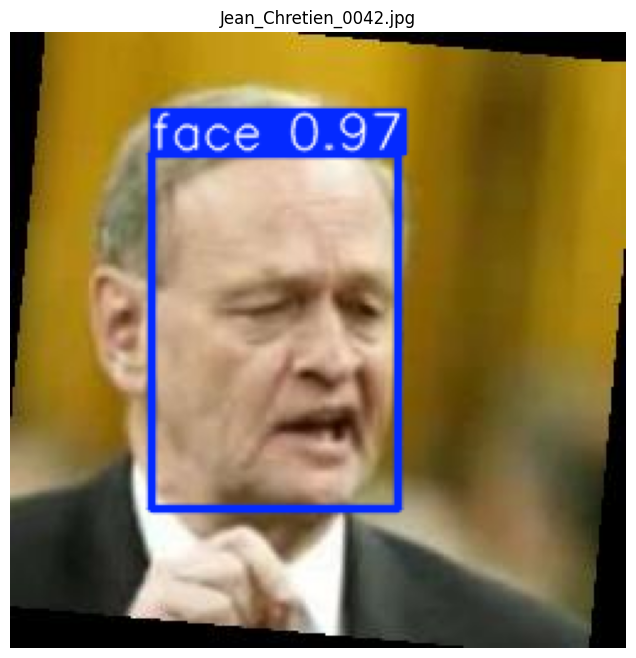

🎯 Running inference on: James_Kopp_0003.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/James_Kopp_0003.jpg: 640x640 1 face, 15.6ms
Speed: 4.1ms preprocess, 15.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


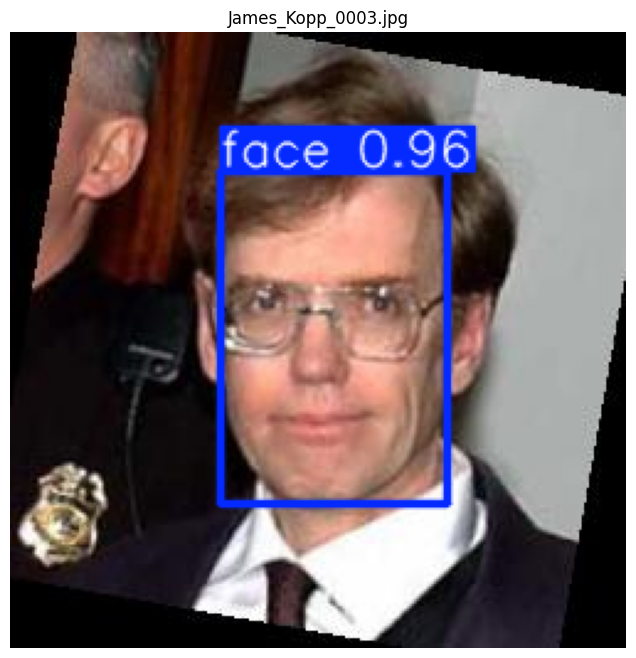

🎯 Running inference on: Thomas_Birmingham_0002.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Thomas_Birmingham_0002.jpg: 640x640 1 face, 15.4ms
Speed: 3.8ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


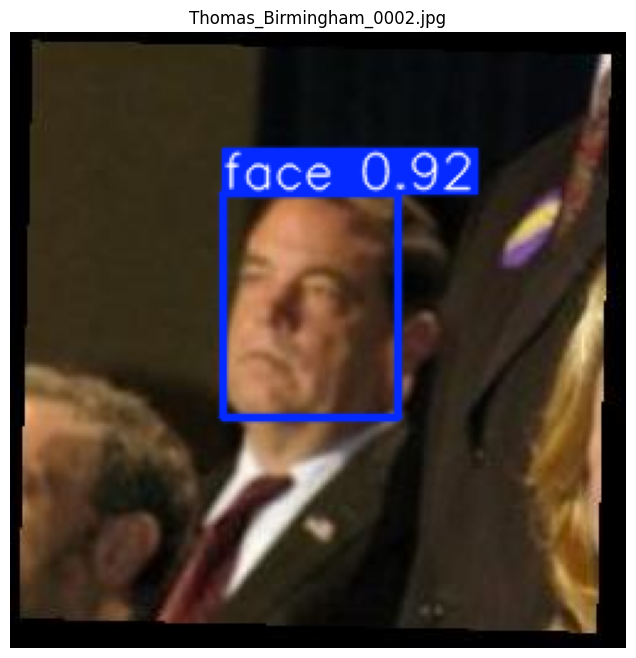

🎯 Running inference on: Oswaldo_Paya_0003.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Oswaldo_Paya_0003.jpg: 640x640 1 face, 15.4ms
Speed: 8.8ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


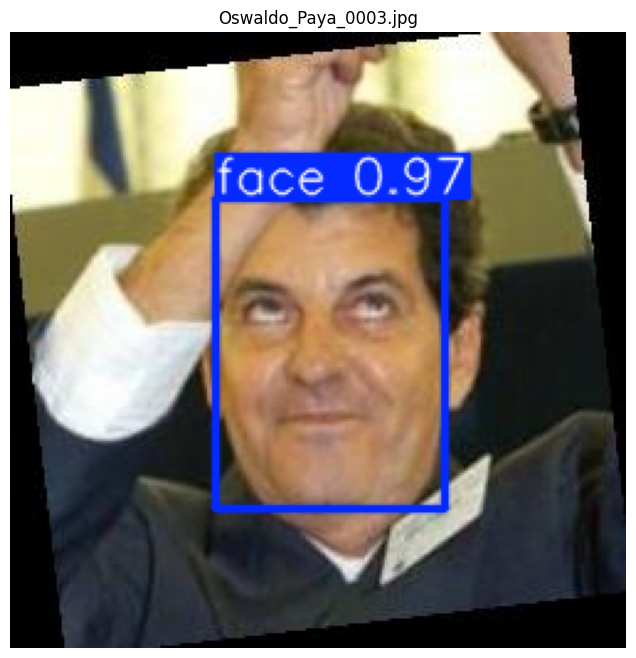

🎯 Running inference on: Sean_Patrick_OMalley_0001.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Sean_Patrick_OMalley_0001.jpg: 640x640 1 face, 18.4ms
Speed: 3.2ms preprocess, 18.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


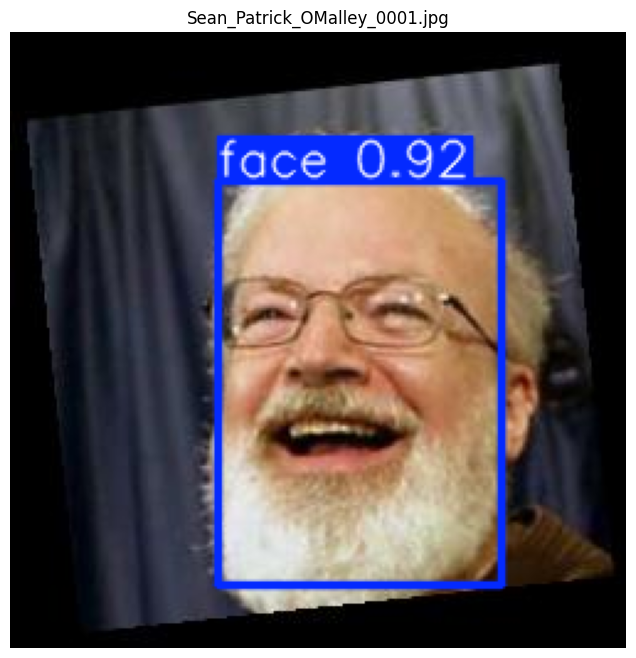

🎯 Running inference on: George_W_Bush_0446.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/George_W_Bush_0446.jpg: 640x640 1 face, 19.6ms
Speed: 3.2ms preprocess, 19.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


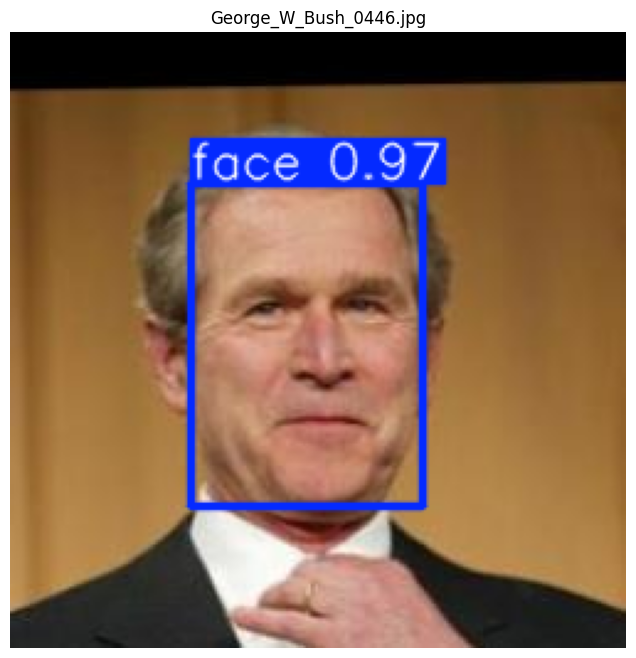

🎯 Running inference on: Jack_Straw_0007.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Jack_Straw_0007.jpg: 640x640 1 face, 15.4ms
Speed: 3.4ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


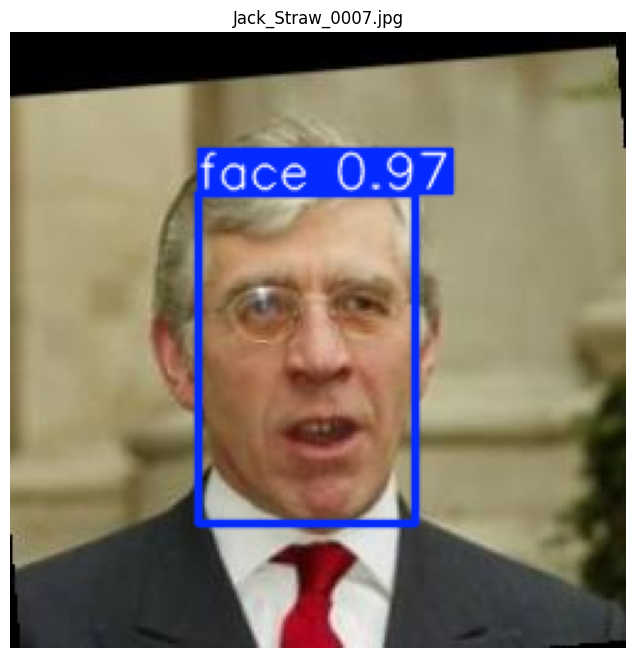

🎯 Running inference on: Mike_Tyson_0002.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Mike_Tyson_0002.jpg: 640x640 2 faces, 15.4ms
Speed: 3.2ms preprocess, 15.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


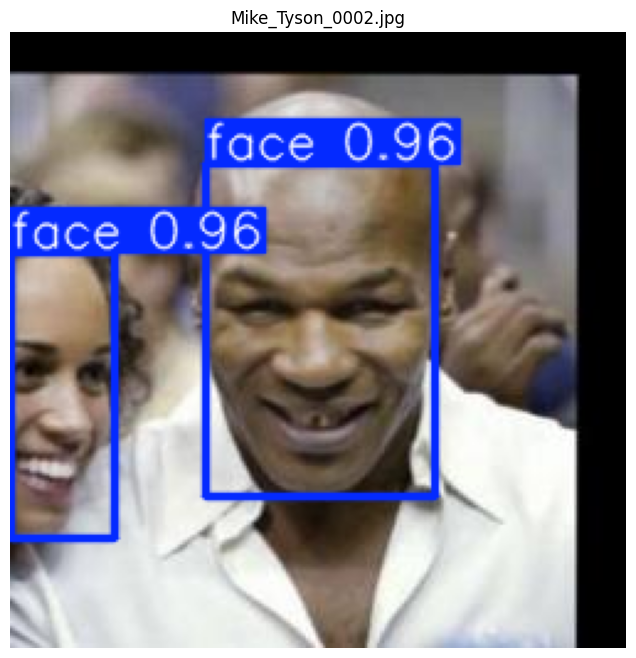

🎯 Running inference on: Sabah_Al-Ahmad_Al-Jaber_Al-Sabah_0001.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Sabah_Al-Ahmad_Al-Jaber_Al-Sabah_0001.jpg: 640x640 1 face, 17.0ms
Speed: 3.2ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


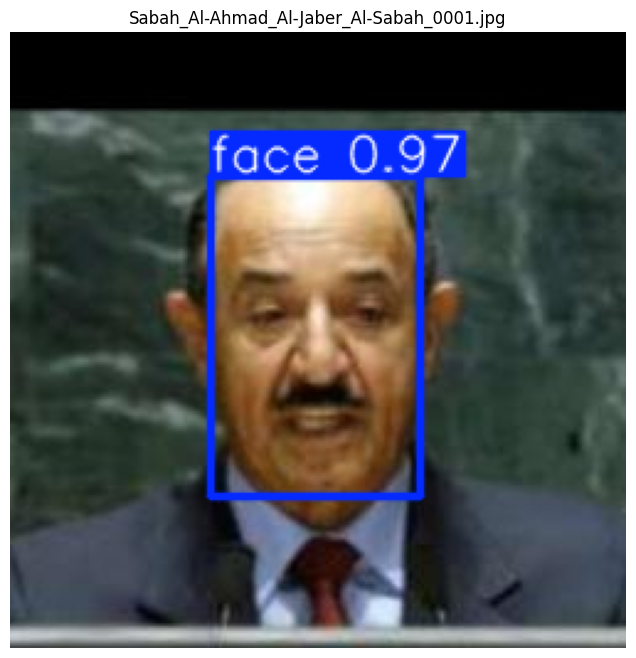

🎯 Running inference on: Laura_Bush_0040.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Laura_Bush_0040.jpg: 640x640 1 face, 23.7ms
Speed: 3.3ms preprocess, 23.7ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)


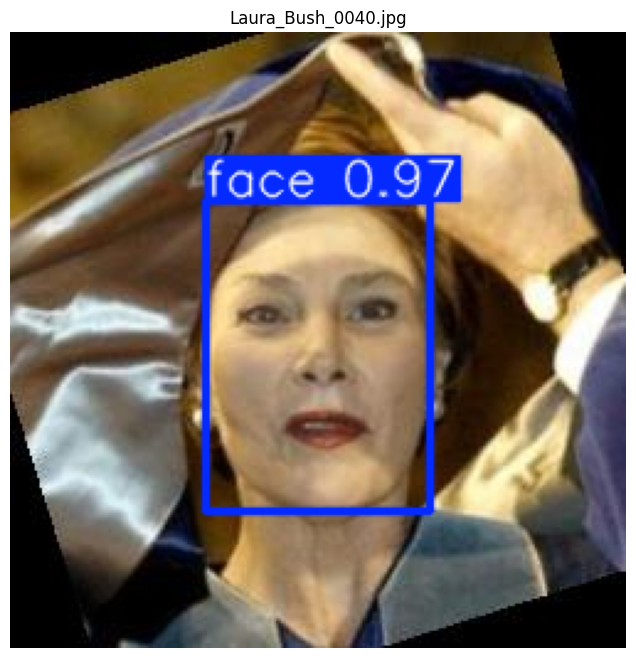

🎯 Running inference on: Ashanti_0002.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Ashanti_0002.jpg: 640x640 1 face, 52.3ms
Speed: 7.4ms preprocess, 52.3ms inference, 6.3ms postprocess per image at shape (1, 3, 640, 640)


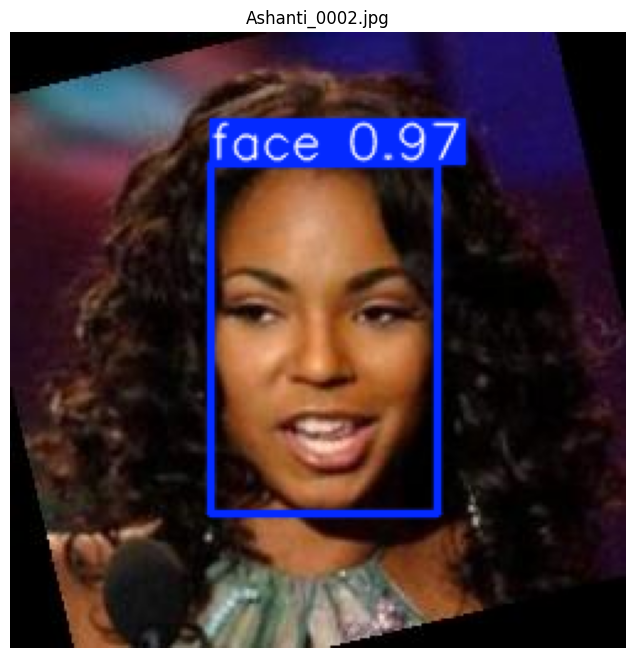

🎯 Running inference on: Roman_Polanski_0001.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Roman_Polanski_0001.jpg: 640x640 3 faces, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


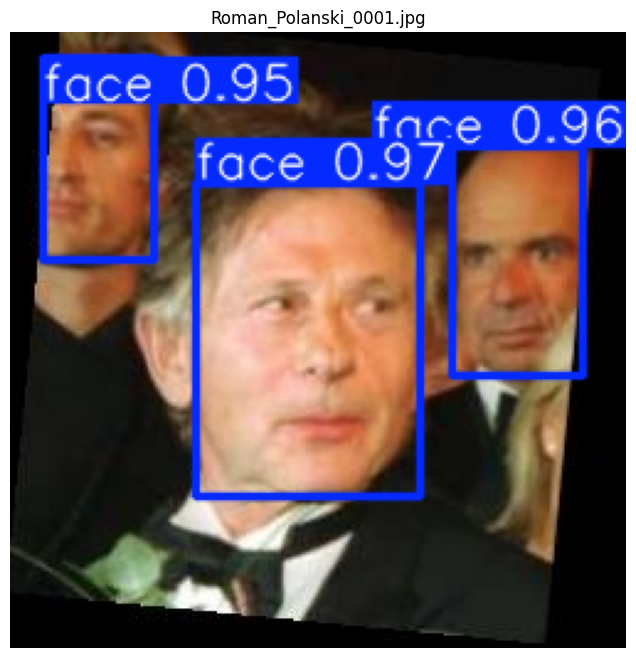

🎯 Running inference on: Ariel_Sharon_0044.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Ariel_Sharon_0044.jpg: 640x640 1 face, 15.4ms
Speed: 3.3ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


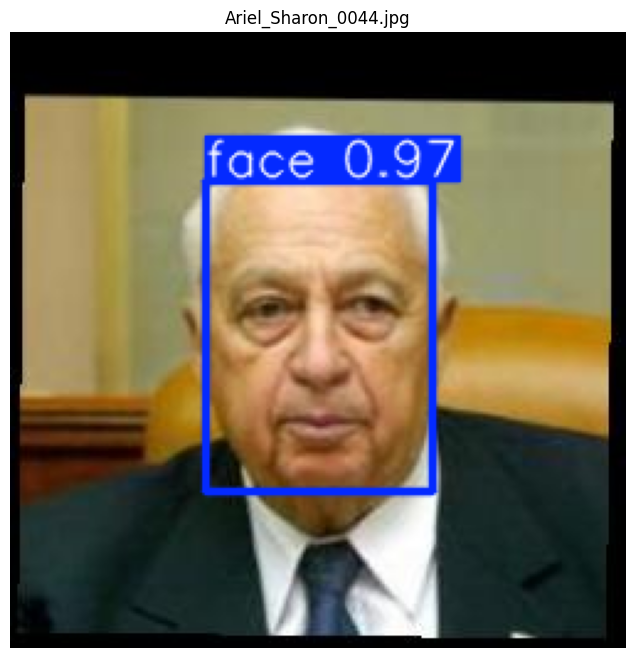

🎯 Running inference on: Amy_Pascal_0001.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Amy_Pascal_0001.jpg: 640x640 1 face, 16.4ms
Speed: 3.2ms preprocess, 16.4ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 640)


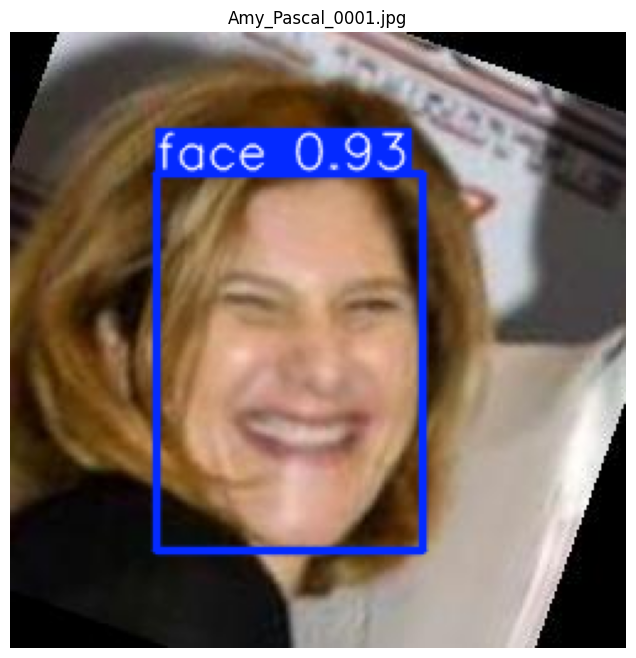

🎯 Running inference on: Pham_Thi_Mai_Phuong_0001.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Pham_Thi_Mai_Phuong_0001.jpg: 640x640 2 faces, 18.2ms
Speed: 3.2ms preprocess, 18.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


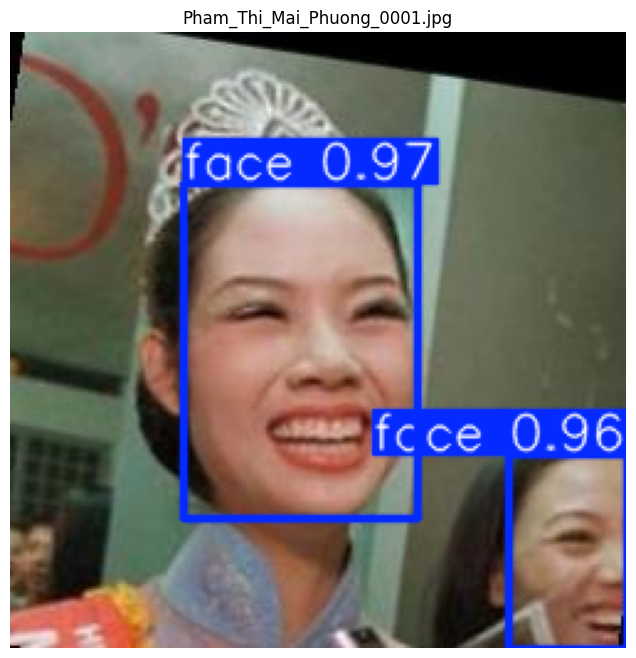

🎯 Running inference on: Lleyton_Hewitt_0003.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Lleyton_Hewitt_0003.jpg: 640x640 1 face, 15.7ms
Speed: 3.3ms preprocess, 15.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


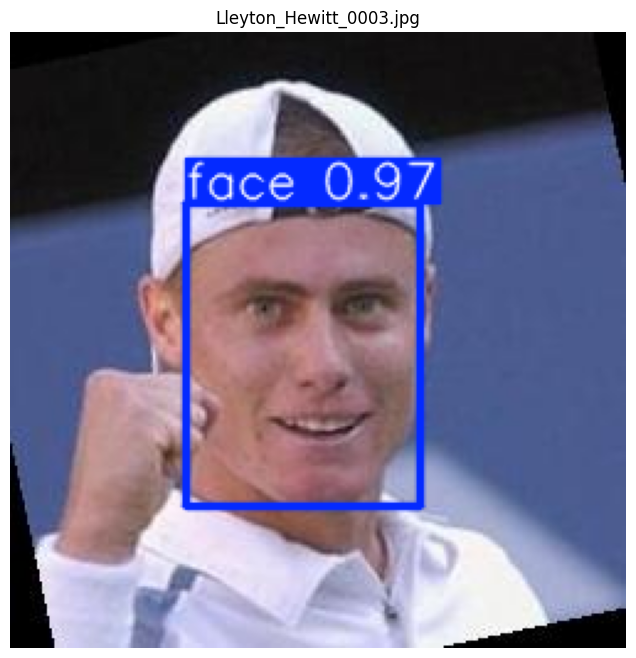

🎯 Running inference on: Terence_Newman_0001.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Terence_Newman_0001.jpg: 640x640 1 face, 16.2ms
Speed: 3.3ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


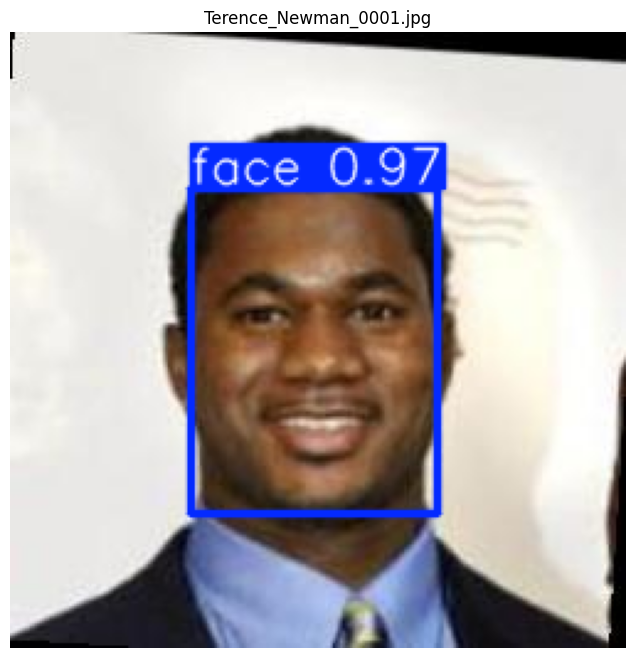

🎯 Running inference on: Ron_Dittemore_0005.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Ron_Dittemore_0005.jpg: 640x640 1 face, 18.1ms
Speed: 3.3ms preprocess, 18.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


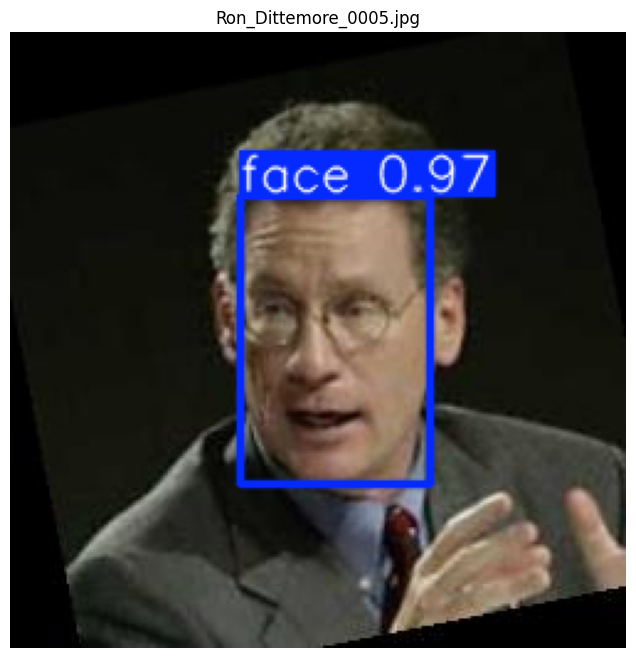

🎯 Running inference on: Sharon_Osbourne_0002.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Sharon_Osbourne_0002.jpg: 640x640 2 faces, 15.4ms
Speed: 3.2ms preprocess, 15.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


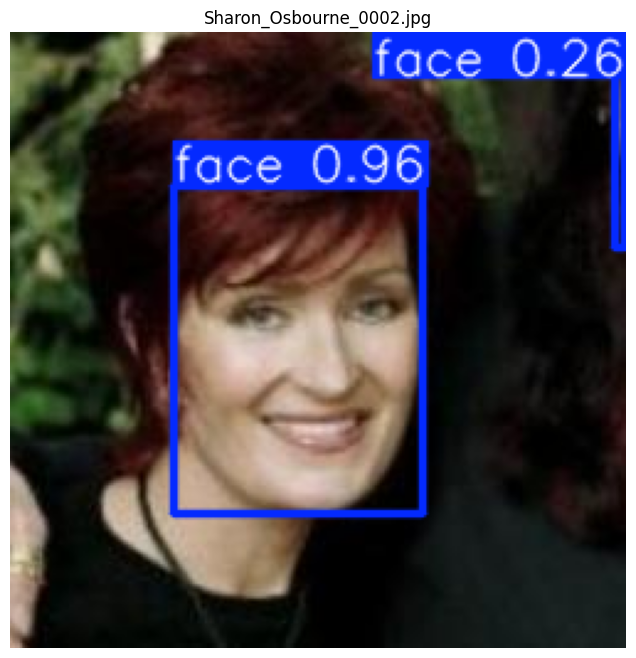

🎯 Running inference on: Joan_Laporta_0008.jpg

image 1/1 /content/drive/MyDrive/lfw_project/lfw_yolo/test/images/Joan_Laporta_0008.jpg: 640x640 1 face, 15.4ms
Speed: 4.1ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


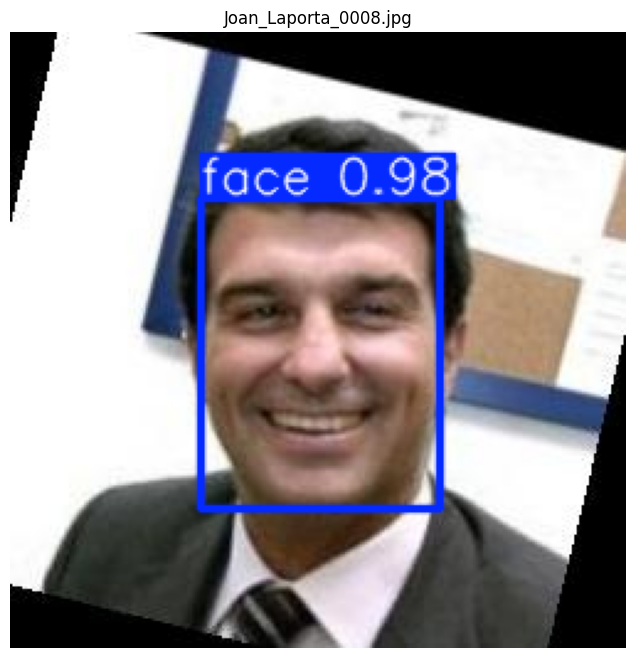

In [ ]:
from ultralytics import YOLO
import os, random
import cv2
import matplotlib.pyplot as plt

model_path = "/content/drive/MyDrive/lfw_project/runs/yolo11s_lfw5/weights/best.pt"
model = YOLO(model_path)

# مسار صور test
test_path = "/content/drive/MyDrive/lfw_project/lfw_yolo/test/images"

# عينات عشوائية من الصور
sample_imgs = random.sample(os.listdir(test_path), 30)

# اعمل inference واعرض النتائج
for img in sample_imgs:
    img_path = os.path.join(test_path, img)
    print(f"🎯 Running inference on: {img}")

    results = model.predict(img_path, conf=0.25)

    for r in results:
        img_with_boxes = r.plot()
        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
        plt.title(img)
        plt.axis("off")
        plt.show()


In [ ]:
from ultralytics import YOLO

# 1️⃣ Load the trained model
model = YOLO("/content/drive/MyDrive/lfw_project/runs/yolo11s_lfw5/weights/best.pt")

# 2️⃣ Path to your input video
input_video = "/content/drive/MyDrive/lfw_project/Test_Video/Shingeki no Kyojin The Final Season - Kanketsu-hen الحلقة  2 و الأاخيرة - Trim.mp4"

# 3️⃣ Run inference on the video and save results in Google Drive
results = model.predict(
    source=input_video,
    save=True,
    project="/content/drive/MyDrive/lfw_project/video_results",
    name="video_test_tune",
    conf=0.1,
    iou=0.45,
    imgsz=1280,
    augment=True,
    show_labels=True,
    show_conf=True
)


print("✅ Video prediction completed!")
print("📂 The output video is saved in: /content/drive/MyDrive/lfw_project/video_results/video_test/")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2968) /content/drive/MyDrive/lfw_project/Test_Video/Shingeki no Kyojin The Final Season - Kanketsu-hen الحلقة  2 و الأاخيرة -